In [224]:
# 必要なライブラリをインポート
import pandas as pd
import numpy as np
import pandas_profiling as pdp
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import pickle
import lightgbm as lgb

# 警告文を非表示にする
import warnings
warnings.simplefilter('ignore')

In [225]:
env_colab   = False   # jupyter notebookを利用する場合

In [226]:
  ### jupyter notebookで読み込み ###
  train_df  = pd.read_csv('data/train.csv')             # train.csvの読み込み
  test_df   = pd.read_csv('data/test.csv')              # test.csvの読み込み
  sub_df    = pd.read_csv('data/sample_submission.csv') # sample_submission.csvの読み込み

In [227]:
train_df.shape

(95512, 30)

In [228]:
train_df.columns

Index(['ID', 'hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'deposit_type', 'agent', 'company',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

In [140]:
train_df.head(5)

,ID,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,reserved_room_type,assigned_room_type,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,1,City Hotel,1,4,2016,February,8,15,1,3,...,A,A,No Deposit,28.0,NaN,0,Transient,92.65,0,1
1,2,City Hotel,1,175,2017,June,23,9,0,2,...,A,A,No Deposit,3.0,NaN,0,Transient-Party,99.00,0,0
2,3,City Hotel,1,34,2015,December,50,8,0,2,...,A,A,Non Refund,19.0,NaN,0,Transient,90.00,0,0
3,4,City Hotel,1,61,2017,January,4,25,0,2,...,A,A,Non Refund,326.0,NaN,0,Transient,80.00,0,0
4,5,City Hotel,0,16,2016,December,52,22,2,3,...,A,D,No Deposit,89.0,NaN,0,Transient,70.72,0,0


In [141]:
train_df.tail(5)

,ID,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,reserved_room_type,assigned_room_type,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
95507,95508,City Hotel,1,305,2016,November,45,4,1,2,...,A,A,Non Refund,21.0,NaN,0,Transient,89.00,0,0
95508,95509,Resort Hotel,0,265,2016,September,36,2,2,5,...,A,A,No Deposit,171.0,NaN,0,Transient,101.43,0,0
95509,95510,City Hotel,1,368,2017,June,26,28,0,3,...,A,A,Non Refund,229.0,NaN,0,Transient,90.00,0,0
95510,95511,Resort Hotel,0,77,2017,January,1,3,0,1,...,A,D,No Deposit,241.0,NaN,0,Transient,29.11,0,3
95511,95512,Resort Hotel,0,2,2017,March,10,6,1,2,...,A,A,No Deposit,171.0,NaN,0,Transient,30.00,0,1


In [142]:
train_df.dtypes

ID                                  int64
hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
deposit_type                       object
agent                             

In [143]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95512 entries, 0 to 95511
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ID                              95512 non-null  int64  
 1   hotel                           95512 non-null  object 
 2   is_canceled                     95512 non-null  int64  
 3   lead_time                       95512 non-null  int64  
 4   arrival_date_year               95512 non-null  int64  
 5   arrival_date_month              95512 non-null  object 
 6   arrival_date_week_number        95512 non-null  int64  
 7   arrival_date_day_of_month       95512 non-null  int64  
 8   stays_in_weekend_nights         95512 non-null  int64  
 9   stays_in_week_nights            95512 non-null  int64  
 10  adults                          95512 non-null  int64  
 11  children                        95510 non-null  float64
 12  babies                          

In [144]:
train_df.count()

ID                                95512
hotel                             95512
is_canceled                       95512
lead_time                         95512
arrival_date_year                 95512
arrival_date_month                95512
arrival_date_week_number          95512
arrival_date_day_of_month         95512
stays_in_weekend_nights           95512
stays_in_week_nights              95512
adults                            95512
children                          95510
babies                            95512
meal                              95512
country                           95112
market_segment                    95512
distribution_channel              95512
is_repeated_guest                 95512
previous_cancellations            95512
previous_bookings_not_canceled    95512
reserved_room_type                95512
assigned_room_type                95512
deposit_type                      95512
agent                             82459
company                            5432


In [145]:
train_df.isna().sum()

ID                                    0
hotel                                 0
is_canceled                           0
lead_time                             0
arrival_date_year                     0
arrival_date_month                    0
arrival_date_week_number              0
arrival_date_day_of_month             0
stays_in_weekend_nights               0
stays_in_week_nights                  0
adults                                0
children                              2
babies                                0
meal                                  0
country                             400
market_segment                        0
distribution_channel                  0
is_repeated_guest                     0
previous_cancellations                0
previous_bookings_not_canceled        0
reserved_room_type                    0
assigned_room_type                    0
deposit_type                          0
agent                             13053
company                           90080


In [146]:
train_df.describe()

,ID,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95510.00000,95512.000000,95512.000000,95512.00000,95512.000000,82459.000000,5432.000000,95512.000000,95512.000000,95512.000000,95512.000000
mean,47756.500000,0.370414,104.018165,2016.160043,27.115807,15.782195,0.927171,2.500335,1.855694,0.10468,0.007873,0.031912,0.08578,0.136988,87.007846,190.082290,2.299355,101.643916,0.062484,0.571289
std,27572.083793,0.482918,106.889162,0.708306,13.606734,8.778795,0.999856,1.909299,0.590307,0.40034,0.098681,0.175767,0.82883,1.504391,110.866652,132.077053,17.630724,48.158325,0.245513,0.791696
min,1.000000,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,1.000000,8.000000,0.000000,-6.380000,0.000000,0.000000
25%,23878.750000,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.00000,0.000000,0.000000,0.00000,0.000000,9.000000,67.000000,0.000000,69.000000,0.000000,0.000000
50%,47756.500000,0.000000,69.000000,2016.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.00000,0.000000,0.000000,0.00000,0.000000,14.000000,179.000000,0.000000,94.500000,0.000000,0.000000
75%,71634.250000,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.00000,0.000000,0.000000,0.00000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,95512.000000,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.00000,10.000000,1.000000,26.00000,72.000000,535.000000,543.000000,391.000000,510.000000,8.000000,5.000000


In [147]:
test_df.describe()

,ID,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,23878.0000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23876.000000,23878.000000,23878.000000,23878.000000,23878.000000,20591.000000,1365.000000,23878.000000,23878.000000,23878.000000,23878.000000
mean,107451.5000,103.984421,2016.142600,27.362635,15.862426,0.929307,2.500168,1.859243,0.100729,0.008250,0.031912,0.092470,0.137532,85.434073,186.021245,2.408326,102.579943,0.062652,0.571656
std,6893.1292,106.761006,0.703989,13.597248,8.788852,0.993649,1.904266,0.532793,0.391359,0.092291,0.175770,0.903703,1.469324,110.398647,129.959148,17.450058,59.092037,0.244406,0.797210
min,95513.0000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,0.000000,0.000000,0.000000
25%,101482.2500,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,51.000000,0.000000,70.000000,0.000000,0.000000
50%,107451.5000,68.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,174.000000,0.000000,95.000000,0.000000,0.000000
75%,113420.7500,162.000000,2017.000000,38.000000,24.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,220.000000,263.000000,0.000000,126.000000,0.000000,1.000000
max,119390.0000,629.000000,2017.000000,53.000000,31.000000,14.000000,34.000000,27.000000,3.000000,2.000000,1.000000,26.000000,71.000000,531.000000,530.000000,391.000000,5400.000000,3.000000,5.000000


In [229]:
train_df = train_df.drop(['agent', 'country', 'company', 'required_car_parking_spaces'], axis=1)

In [230]:
test_df = test_df.drop(['agent', 'country', 'company', 'required_car_parking_spaces'], axis=1)

In [231]:
train_df['hotel'].unique()

array(['City Hotel', 'Resort Hotel'], dtype=object)

In [232]:
train_df['hotel'].value_counts()

City Hotel      63355
Resort Hotel    32157
Name: hotel, dtype: int64

In [233]:
train_df['hotel'] = train_df['hotel'].replace({'City Hotel':0, 'Resort Hotel':1})

In [234]:
test_df['hotel'] = test_df['hotel'].replace({'City Hotel':0, 'Resort Hotel':1})

In [235]:
train_df['arrival_date_month'].unique()

array(['February', 'June', 'December', 'January', 'May', 'October',
       'March', 'August', 'September', 'July', 'April', 'November'],
      dtype=object)

In [236]:
train_df['arrival_date_month'].value_counts()

August       11132
July         10062
May           9506
April         8924
October       8862
June          8721
September     8355
March         7881
February      6499
November      5447
December      5393
January       4730
Name: arrival_date_month, dtype: int64

In [237]:
train_df['arrival_date_month'] = train_df['arrival_date_month'].replace({'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 
                                                                         'August':8, 'September':9, 'October':10, 'November':11,'December':12})

In [238]:
test_df['arrival_date_month'] = test_df['arrival_date_month'].replace({'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 
                                                                         'August':8, 'September':9, 'October':10, 'November':11,'December':12})

In [239]:
train_df['meal'].unique()

array(['BB', 'HB', 'SC', 'Undefined', 'FB'], dtype=object)

In [240]:
train_df['meal'].value_counts()

BB           73837
HB           11566
SC            8539
Undefined      940
FB             630
Name: meal, dtype: int64

In [241]:
train_df['meal'] = train_df['meal'].replace({'BB':0, 'HB':1, 'SC':2, 'FB':3, 'Undefined':4})

In [242]:
test_df['meal'] = test_df['meal'].replace({'BB':0, 'HB':1, 'SC':2, 'FB':3, 'Undefined':4})

In [243]:
train_df['market_segment'].unique()

array(['Offline TA/TO', 'Groups', 'Online TA', 'Direct', 'Corporate',
       'Complementary', 'Aviation', 'Undefined'], dtype=object)

In [244]:
train_df['market_segment'].value_counts()

Online TA        45190
Offline TA/TO    19391
Groups           15807
Direct           10127
Corporate         4214
Complementary      598
Aviation           184
Undefined            1
Name: market_segment, dtype: int64

In [245]:
train_df['market_segment'] = train_df['market_segment'].replace({'Offline TA/TO':0, 'Groups':1, 'Online TA':2, 'Direct':3, 'Corporate':4,
       'Complementary':5, 'Aviation':6, 'Undefined':7})

In [246]:
test_df['market_segment'] = test_df['market_segment'].replace({'Offline TA/TO':0, 'Groups':1, 'Online TA':2, 'Direct':3, 'Corporate':4,
       'Complementary':5, 'Aviation':6, 'Undefined':7})

In [247]:
train_df['distribution_channel'].unique()

array(['TA/TO', 'Corporate', 'Direct', 'GDS', 'Undefined'], dtype=object)

In [248]:
train_df['distribution_channel'].value_counts()

TA/TO        78309
Direct       11747
Corporate     5300
GDS            153
Undefined        3
Name: distribution_channel, dtype: int64

In [249]:
train_df['distribution_channel'] = train_df['distribution_channel'].replace({'TA/TO':0, 'Corporate':1, 'Direct':2, 'GDS':3, 'Undefined':4})

In [250]:
test_df['distribution_channel'] = test_df['distribution_channel'].replace({'TA/TO':0, 'Corporate':1, 'Direct':2, 'GDS':3, 'Undefined':4})

In [251]:
train_df['deposit_type'].unique()

array(['No Deposit', 'Non Refund', 'Refundable'], dtype=object)

In [252]:
train_df['deposit_type'].value_counts()

No Deposit    83701
Non Refund    11680
Refundable      131
Name: deposit_type, dtype: int64

In [253]:
train_df['deposit_type'] = train_df['deposit_type'].replace({'No Deposit':0, 'Non Refund':1, 'Refundable':2})

In [254]:
test_df['deposit_type'] = test_df['deposit_type'].replace({'No Deposit':0, 'Non Refund':1, 'Refundable':2})

In [255]:
train_df['customer_type'].unique()

array(['Transient', 'Transient-Party', 'Contract', 'Group'], dtype=object)

In [256]:
train_df['customer_type'].value_counts()

Transient          71718
Transient-Party    20045
Contract            3291
Group                458
Name: customer_type, dtype: int64

In [257]:
train_df['customer_type'] = train_df['customer_type'].replace({'Transient':0, 'Transient-Party':2, 'Contract':3, 'Group':4})

In [258]:
test_df['customer_type'] = test_df['customer_type'].replace({'Transient':0, 'Transient-Party':2, 'Contract':3, 'Group':4})

In [259]:
train_df['reserved_room_type'].unique()

array(['A', 'D', 'E', 'G', 'C', 'B', 'H', 'F', 'L', 'P'], dtype=object)

In [260]:
train_df['reserved_room_type'].value_counts()

A    68858
D    15344
E     5193
F     2304
G     1685
B      898
C      734
H      480
P       10
L        6
Name: reserved_room_type, dtype: int64

In [261]:
train_df['assigned_room_type'].unique()

array(['A', 'D', 'I', 'E', 'C', 'G', 'F', 'H', 'B', 'K', 'P', 'L'],
      dtype=object)

In [262]:
train_df['assigned_room_type'].value_counts()

A    59235
D    20293
E     6213
F     2985
G     2051
C     1881
B     1750
H      576
I      287
K      230
P       10
L        1
Name: assigned_room_type, dtype: int64

In [263]:
train_df['room_not_as_requested'] = (train_df['reserved_room_type'] == train_df['assigned_room_type']).astype(int)

In [264]:
test_df['room_not_as_requested'] = (test_df['reserved_room_type'] == test_df['assigned_room_type']).astype(int)

In [265]:
train_df = train_df.drop(['reserved_room_type', 'assigned_room_type'], axis=1)

In [266]:
test_df = test_df.drop(['reserved_room_type', 'assigned_room_type'], axis=1)

In [267]:
train_df['adr'].unique()

array([ 92.65,  99.  ,  90.  , ..., 198.86,  34.8 , 219.14])

In [268]:
train_df['adr'].nunique()

8002

In [269]:
train_df['adr'].value_counts()

62.00     2995
75.00     2145
90.00     1982
65.00     1909
0.00      1573
          ... 
84.05        1
101.54       1
310.20       1
105.65       1
219.14       1
Name: adr, Length: 8002, dtype: int64

In [270]:
train_df['adr'].describe()

count    95512.000000
mean       101.643916
std         48.158325
min         -6.380000
25%         69.000000
50%         94.500000
75%        126.000000
max        510.000000
Name: adr, dtype: float64

In [271]:
train_df[train_df['adr'] < 0]

,ID,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,deposit_type,days_in_waiting_list,customer_type,adr,total_of_special_requests,room_not_as_requested
19917,19918,1,0,195,2017,3,10,5,4,6,...,2,1,0,2,0,0,2,-6.38,0,0


In [272]:
test_df['adr'].unique()

array([ 35.1 , 126.  , 124.45, ..., 154.5 , 157.53, 170.7 ])

In [273]:
test_df['adr'].nunique()

3705

In [274]:
test_df['adr'].value_counts()

62.00     759
75.00     570
65.00     509
90.00     491
0.00      386
         ... 
65.61       1
182.25      1
128.65      1
74.68       1
170.70      1
Name: adr, Length: 3705, dtype: int64

In [275]:
test_df[test_df['adr'] > 500]

,ID,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,deposit_type,days_in_waiting_list,customer_type,adr,total_of_special_requests,room_not_as_requested
15784,111297,0,35,2016,3,13,25,0,1,2,...,0,0,0,0,1,0,0,5400.0,0,1


In [191]:
def return_nan_if_outlier(adr):
    if adr < 0 or adr > 500:
        return np.nan
    else:
        return adr

return_nan_if_outlier(300)

300

In [276]:
train_df['adr'].apply(return_nan_if_outlier)

0         92.65
1         99.00
2         90.00
3         80.00
4         70.72
          ...  
95507     89.00
95508    101.43
95509     90.00
95510     29.11
95511     30.00
Name: adr, Length: 95512, dtype: float64

In [277]:
train_df['adr'] = train_df['adr'].apply(return_nan_if_outlier)

In [278]:
test_df['adr'] = test_df['adr'].apply(return_nan_if_outlier)

In [279]:
train_df['adr'].mean()

101.63651687275545

In [280]:
test_df['adr'].mean()

102.35808057963732

In [281]:
train_df['adr'] = train_df['adr'].fillna(train_df['adr'].mean())
test_df['adr'] = test_df['adr'].fillna(test_df['adr'].mean())

In [282]:
train_df.describe()

,ID,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,deposit_type,days_in_waiting_list,customer_type,adr,total_of_special_requests,room_not_as_requested
count,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,...,95512.000000,95512.000000,95512.00000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000,95512.000000
mean,47756.500000,0.336680,0.370414,104.018165,2016.160043,6.542225,27.115807,15.782195,0.927171,2.500335,...,0.306401,0.031912,0.08578,0.136988,0.125031,2.299355,0.542288,101.636517,0.571289,0.874581
std,27572.083793,0.472577,0.482918,106.889162,0.708306,3.090398,13.606734,8.778795,0.999856,1.909299,...,0.684465,0.175767,0.82883,1.504391,0.334877,17.630724,0.965526,48.120965,0.791696,0.331195
min,1.000000,0.000000,0.000000,0.000000,2015.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23878.750000,0.000000,0.000000,18.000000,2016.000000,4.000000,16.000000,8.000000,0.000000,1.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,69.000000,0.000000,1.000000
50%,47756.500000,0.000000,0.000000,69.000000,2016.000000,7.000000,27.000000,16.000000,1.000000,2.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,94.500000,0.000000,1.000000
75%,71634.250000,1.000000,1.000000,160.000000,2017.000000,9.000000,38.000000,23.000000,2.000000,3.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,126.000000,1.000000,1.000000
max,95512.000000,1.000000,1.000000,737.000000,2017.000000,12.000000,53.000000,31.000000,19.000000,50.000000,...,4.000000,1.000000,26.00000,72.000000,2.000000,391.000000,4.000000,451.500000,5.000000,1.000000


In [283]:
test_df.describe()

,ID,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,deposit_type,days_in_waiting_list,customer_type,adr,total_of_special_requests,room_not_as_requested
count,23878.0000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,...,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000,23878.000000
mean,107451.5000,0.330974,103.984421,2016.142600,6.593517,27.362635,15.862426,0.929307,2.500168,1.859243,...,0.305763,0.031912,0.092470,0.137532,0.124340,2.408326,0.543974,102.358081,0.571656,0.876958
std,6893.1292,0.470574,106.761006,0.703989,3.091224,13.597248,8.788852,0.993649,1.904266,0.532793,...,0.682702,0.175770,0.903703,1.469324,0.333888,17.450058,0.964663,48.130227,0.797210,0.328492
min,95513.0000,0.000000,0.000000,2015.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,101482.2500,0.000000,18.000000,2016.000000,4.000000,16.000000,8.000000,0.000000,1.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,70.000000,0.000000,1.000000
50%,107451.5000,0.000000,68.000000,2016.000000,7.000000,28.000000,16.000000,1.000000,2.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,95.000000,0.000000,1.000000
75%,113420.7500,1.000000,162.000000,2017.000000,9.000000,38.000000,24.000000,2.000000,3.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,126.000000,1.000000,1.000000
max,119390.0000,1.000000,629.000000,2017.000000,12.000000,53.000000,31.000000,14.000000,34.000000,27.000000,...,4.000000,1.000000,26.000000,71.000000,2.000000,391.000000,4.000000,402.000000,5.000000,1.000000


array([[<AxesSubplot: title={'center': 'ID'}>,
        <AxesSubplot: title={'center': 'hotel'}>,
        <AxesSubplot: title={'center': 'is_canceled'}>,
        <AxesSubplot: title={'center': 'lead_time'}>,
        <AxesSubplot: title={'center': 'arrival_date_year'}>],
       [<AxesSubplot: title={'center': 'arrival_date_month'}>,
        <AxesSubplot: title={'center': 'arrival_date_week_number'}>,
        <AxesSubplot: title={'center': 'arrival_date_day_of_month'}>,
        <AxesSubplot: title={'center': 'stays_in_weekend_nights'}>,
        <AxesSubplot: title={'center': 'stays_in_week_nights'}>],
       [<AxesSubplot: title={'center': 'adults'}>,
        <AxesSubplot: title={'center': 'children'}>,
        <AxesSubplot: title={'center': 'babies'}>,
        <AxesSubplot: title={'center': 'meal'}>,
        <AxesSubplot: title={'center': 'market_segment'}>],
       [<AxesSubplot: title={'center': 'distribution_channel'}>,
        <AxesSubplot: title={'center': 'is_repeated_guest'}>,
   

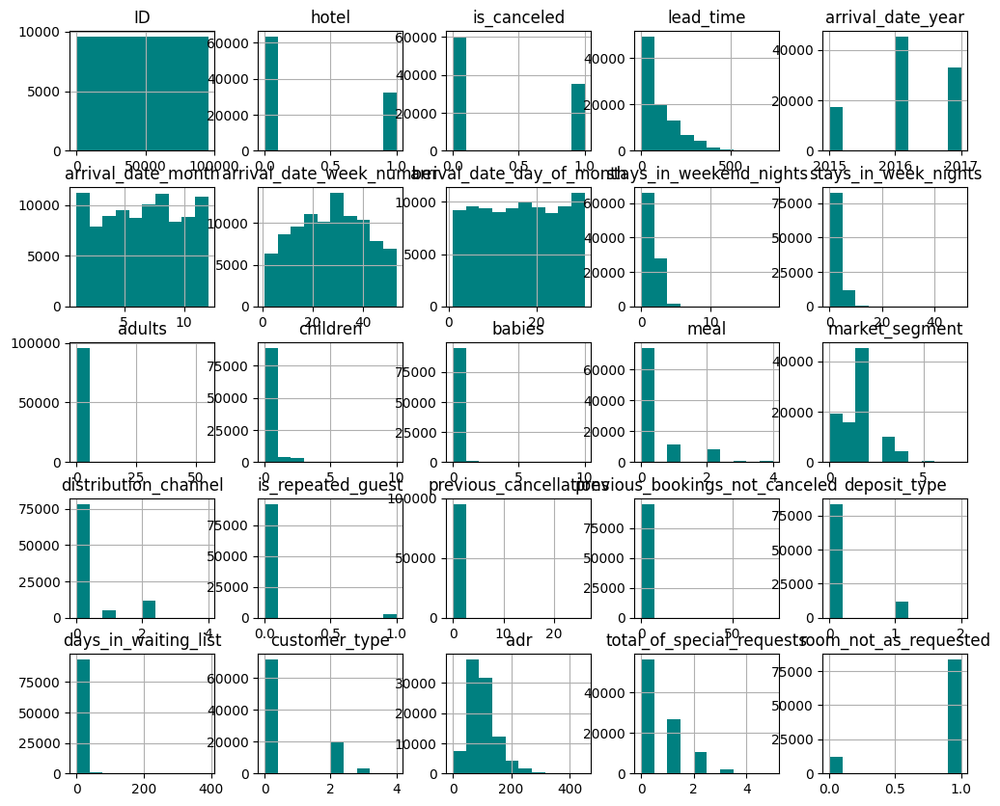

In [284]:
train_df.hist(bins=10, figsize=(12,10), color = 'teal')

In [208]:
pdp.ProfileReport(train_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## チュートリアルの流れ

本チュートリアルでは「LightGBMモデル」を使用して、学習を進めていきます。

---
LightGBMは、決定木の勾配ブースティングアルゴリズムであり、XGBoostに比べ高速(=軽い: Light)であること、欠損値があっても予測が行えることが特徴です。

LightGBMに関する説明は下記資料をご覧ください。

[LightGBM 徹底入門 – LightGBMの使い方や仕組み、XGBoostとの違いについて](https://www.codexa.net/lightgbm-beginner/)

[LightGBMハイパーパラメータ公式ドキュメント](https://lightgbm.readthedocs.io/en/latest/Parameters.html)

---

この後の流れを紹介します。

#### 3.前処理
データ型を確認します。
LightGBMは文字列型データを学習することができないため、文字列型データの列を削除します。

LightGBMは欠損値があっても学習を進めることができます。今回は簡単のため、欠損値処理には触れずに進めていきます。

#### 4.データの整形、分割
train_dfを学習用、検証用に分割します。

ポイントは学習に使ったデータとは別のデータを使って評価することです。

勉強に使った問題と全く同じ問題でテストしたら、殆どの人が満点になってしまうため勉強に使う問題とテストに使う問題は分ける必要があります。

機械学習モデルも同じで、予測精度確認のデータは学習で用いたデータとは別で用意する必要があります。

|    |  説明変数(X)  |  目的変数(y)  |
| :---: | :---: | :---: |
|  学習用データ(train)  |  X_train  |  y_train  |
|  検証用データ(validation)  |  X_val  |  y_val  |

#### 5.モデルの定義、学習
学習用データでモデルに学習させ、検証用データで予測値を算出します。
そして、予測値とy_valを比較してモデルを評価します。

#### 6.提出用データの作成
最後に学習したモデルを利用しテストデータを推論して、提出用データを作成します。


## 3.前処理
まずは、データの前処理を体験してみましょう。

### 文字列型データ

それぞれの列に対して、詳細な情報を確認します。

Dtypeが `int64`, `float64` が数値のみが格納された列で、`object`が文字列型データを含む列です。

In [285]:
train_df.dtypes

ID                                  int64
hotel                               int64
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                  int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                                int64
market_segment                      int64
distribution_channel                int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
deposit_type                        int64
days_in_waiting_list                int64
customer_type                       int64
adr                               float64
total_of_special_requests         

数値データと文字列型データの両方があるとわかります。

【注意】最終行のdtype: objectはdtypesの出力がobject型でされていることを示していています。

LightGBMは文字列型データをそのまま利用することができないため、今回は削除します。

In [7]:
# drop_columns = [
    'hotel',
    'arrival_date_month',
    'meal',
    'country',
    'market_segment',
    'distribution_channel',
    'reserved_room_type',
    'assigned_room_type',
    'deposit_type',
    'customer_type'
]
# train_df  = train_df.drop(columns=drop_columns)
# test_df   = test_df.drop(columns=drop_columns)

In [8]:
# train_df.dtypes

ID                                  int64
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
agent                             float64
company                           float64
days_in_waiting_list                int64
adr                               float64
required_car_parking_spaces         int64
total_of_special_requests           int64
dtype: object

文字列型データが削除されて全て数値データになりました。





##  4.データの整形,分割
目的のデータを説明するデータ（説明変数）と、予測する目的のデータ（目的変数）に分けます。

In [286]:
# 予測するカラム名を指定
target = 'is_canceled'

# 説明変数と目的変数に分ける
X = train_df.drop(columns=[target])
y = train_df[target]

## 5.モデルの定義、学習

学習には以下の手順を踏みます。
1. hold-out法でデータセットを学習用データと検証用データに分割
1. 学習用データでモデルを学習
1. 作成したモデルの精度を検証用データで確認




### 5-1.データの分割

In [287]:
from sklearn.model_selection import train_test_split
# train_test_split関数を用いてhold-out法で分割
# 学習用（train)と評価用（val）、それぞれの説明変数と目的変数の4つを取得

X_train, X_val, y_train, y_val  = train_test_split(
    X,
    y,
    test_size=0.25,   # test_size：validationデータの分割比率
    random_state=1,   # random_state:適当な値を指定すると常に同じように分割する
    shuffle=True      # shuffle:データをシャッフルした後、分割する
)

### 5-2.モデルの定義と学習
いよいよLightGBMを実装します。

まずモデルのライブラリを準備します。

In [288]:
import lightgbm as lgb

学習を行います。

In [289]:
# ハイパーパラメータを指定
lgb_params = {
    'objective': 'binary',
    'metric': 'None'
}

# 学習させるデータを指定
lgb_train = lgb.Dataset(X_train, y_train)
lgb_val   = lgb.Dataset(X_val, y_val)

# モデルをインスタンス化し、訓練データで学習
model = lgb.train(
    lgb_params,
    lgb_train,
    valid_sets=lgb_val
    )

[LightGBM] [Info] Number of positive: 26555, number of negative: 45079
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1114
[LightGBM] [Info] Number of data points in the train set: 71634, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370704 -> initscore=-0.529198
[LightGBM] [Info] Start training from score -0.529198


### 5-3. 評価
検証用データの予測をして、モデルを評価します。

In [290]:
# 評価指標のライブラリをインポート
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

# 学習済のモデルで評価用データに対して推論を行う (正例の予測確率)
y_pred_proba = model.predict(X_val, num_iteration=model.best_iteration)
y_pred        = y_pred_proba.round().astype(int)  # testの予測値を四捨五入し、0,1にする

print('Accuracy', accuracy_score(y_val, y_pred))      # Accuracyを計算
print('Recall', recall_score(y_val, y_pred))          # Recallを計算
print('Precision', precision_score(y_val, y_pred))    # Precisionを計算
print('f1 score', f1_score(y_val, y_pred))            # f1_scoreを計算

Accuracy 0.8313510344249937
Recall 0.6611514052583862
Precision 0.8490758259350895
f1 score 0.7434214718063077


Accuracy、Recall、Precision、F1_scoreで精度を算出することができました。

---



## 6.提出用データの作成

最後に学習したモデルを利用しテストデータを推論して、提出用データを作成しましょう。

In [291]:
# 推論
y_test_pred_proba = model.predict(test_df)
y_test_pred = y_test_pred_proba.round().astype(int) # testの予測値を四捨五入し、0,1にする

### 推論結果を用いて提出用データを作成

In [292]:
sub_y = test_df.copy()
sub_y["prediction"] = y_test_pred
sub_y = sub_y[["ID", "prediction"]]
sub_y.to_csv('submission02.csv', index=False)
if env_colab == True:
  from google.colab import files
  files.download('submission02.csv')

作成したsubmission.csvをprobspaceに提出してみましょう！

お疲れ様でした！

今後トピックにはより詳細なチュートリアルを掲載する予定です。ご期待ください！